# Simulation | [0,-27] Free-Free

In [1]:
import joblib
import timeit

def savedata( name, obj ):
    tic=timeit.default_timer()
    with open( name,'wb' ) as Gv:
        joblib.dump( obj, Gv)
    toc=timeit.default_timer()
    print(toc - tic)
    
def loaddata( name ):
    tic=timeit.default_timer()
    with open( name,'rb' ) as Gv:
        mydata = joblib.load( Gv)
    toc=timeit.default_timer()
    print(toc - tic)
    return mydata

def load_Gfree_fitmap():
    Gfree_FoV2_fitmap = loaddata('Gfree_FoV2_fitmap.db')
    Gfree_FoV4_fitmap = loaddata('Gfree_FoV4_fitmap.db')
    return Gfree_FoV4_fitmap, Gfree_FoV2_fitmap
    
def load_Gsync_fitmap():
    Gsync_FoV2_fitmap = loaddata('Gsync_FoV2_fitmap.db')
    Gsync_FoV4_fitmap = loaddata('Gsync_FoV4_fitmap.db')
    return Gsync_FoV4_fitmap, Gsync_FoV2_fitmap

def load_Gfree_simmap():
    Fov4patch_map = loaddata('Gfree_FoV4_simmap.db')
    Fov4patch_gss = loaddata('Gfree_FoV4_simgss.db')
    Fov2patch_map = loaddata('Gfree_FoV2_simmap.db')
    Fov2patch_gss = loaddata('Gfree_FoV2_simgss.db')
    return Fov4patch_map, Fov4patch_gss, Fov2patch_map, Fov2patch_gss

def load_Gsync_simmap():
    Fov4patch_map = loaddata('Gsync_FoV4_simmap.db')
    Fov4patch_gss = loaddata('Gsync_FoV4_simgss.db')
    Fov2patch_map = loaddata('Gsync_FoV2_simmap.db')
    Fov2patch_gss = loaddata('Gsync_FoV2_simgss.db')
    return Fov4patch_map, Fov4patch_gss, Fov2patch_map, Fov2patch_gss

In [2]:
import pickle
from MCMC import MCMC
%matplotlib inline
from GalacticDev import GalacticDev

In [3]:
from GalacticCore import *
from astropy.io import fits

### Load maps

In [4]:
SF4_map, SF4_gss, SF2_map, SF2_gss = load_Gfree_simmap()

0.3356475289911032
0.335704380646348
0.10468043573200703
0.1402233298867941


In [5]:
SF4_fitmap, SF2_fitmap = load_Gfree_fitmap()

0.018376583233475685
0.07173132710158825


#### Set-up gss-map

In [6]:
fov2grf = {}
fov2grf['fit'] = whiten(SF2_fitmap['gss'])
fov2grf['sim'] = whiten(SF2_gss)

In [7]:
fov4grf = {}
fov4grf['fit'] = whiten(SF4_fitmap['gss'])
fov4grf['sim'] = whiten(SF4_gss)

### FoV4x4

In [8]:
Sfov4 = GalacticDev( comp='Gfree', nside=32768, use_G02=True, extra_large_mode=True, grfmap=fov4grf, grfpatch=True, fov = ( 4, 4 ), sim_pixel = 2, default=True )

2022-08-13 13:22:00,569 : createlog : INFO : Log Header >> Action Time : Fuction or method: level : Message
2022-08-13 13:22:00,571 : createlog : INFO : Log standard output streaming is False
2022-08-13 13:22:00,571 : createlog : INFO : GSim_Gfree_Default_True_08_13_2022_132200.log log file is created
2022-08-13 13:22:00,572 : createlog : INFO : Log is created by cxshan
2022-08-13 13:22:00,573 : createlog : INFO : Log level is debug
2022-08-13 13:22:00,574 : __init__ : INFO :  ⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇⬇ 
2022-08-13 13:22:00,575 : __init__ : INFO :  Galactic Gfree simulation is initializing! 
2022-08-13 13:22:00,575 : __init__ : WARNING :  sigma_tem default unit is [arcmin]! 
2022-08-13 13:22:00,576 : _set_comp : INFO : compID is galactic/freefree, name is Galactic free-free
2022-08-13 13:22:00,577 : _set_default_io : INFO : Default IO is set. Output dir is /home/cxshan/data/fg21sim+/GalacticSimData/, clobber is True.
2022-08-13 13:22:00,578 : _set_default_params : INFO :  Default settings ar

 Please update the healpix maps when you need to. 


In [9]:
S = Sfov4

In [10]:
S.filename_pattern = '{prefix}_fov4_0-27_{frequency:06.2f}.fits'

In [11]:
S.filename_pattern

'{prefix}_fov4_0-27_{frequency:06.2f}.fits'

In [12]:
s_outhig = '/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4'
s_outmid = '/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4'
s_outlow = '/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4'

In [13]:
S.set_gamma(-2.42645582)

2022-08-13 13:22:07,236 : set_gamma : INFO :  gamma is set as -2.42645582 


In [14]:
S.set_alpha(0.007854707431278349)
S.set_beta(0.5260103708880837)

2022-08-13 13:22:07,563 : set_alpha : INFO :  alpha is set as 0.007854707431278349 
2022-08-13 13:22:07,564 : set_beta : INFO :  beta is set as 0.5260103708880837 


#### Set up frequency simulation

In [15]:
S._set_up_freq()

2022-08-13 13:22:08,361 : gen_simmap : INFO : Using mask filled map to generate simulation image.
2022-08-13 13:23:48,944 : gen_simmap : INFO :  Finish generating the original image for simulation, using 100.58128091879189 s.
2022-08-13 13:23:48,946 : gen_simmap : INFO : Input patch flag detected. Using user input GRF patch for simulation.
2022-08-13 13:23:49,528 : _set_physical_params : INFO :  Physical params are set. 


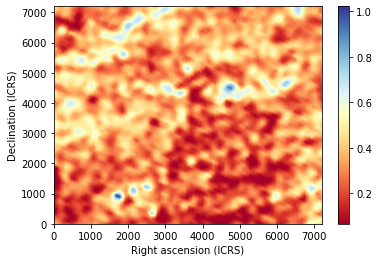

In [16]:
S.viewslice(S.patch_map)

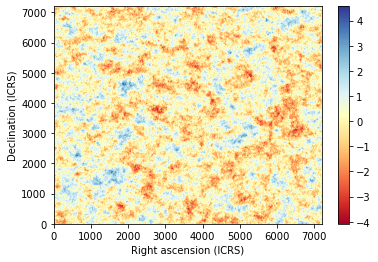

In [18]:
S.viewslice(S.patch_gss)

In [19]:
smoothed_input_map = S.smooth_sky(0.4, S.skypatch)

2022-08-13 13:25:10,909 : smooth_sky : INFO : Smoothing the <Ut.sky.SkyPatch object at 0x7ffb7b29b9d0> with a Gaussian filter ...
2022-08-13 13:25:45,090 : smooth_sky : INFO : Smoothed sky patch using Gaussian filter of sigma = 72.00 [pixel]


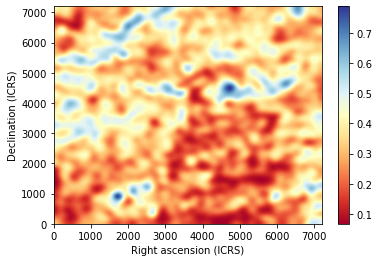

In [20]:
S.viewslice(smoothed_input_map)

In [21]:
S.skypatch.data = smoothed_input_map

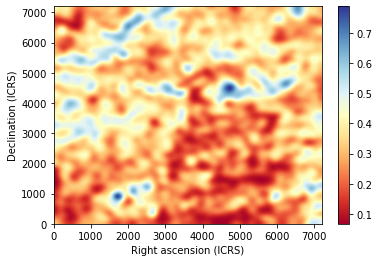

In [22]:
S.viewslice(S.skypatch.data)

### Simulate one freq

In [23]:
F158 = S.simulate_frequency(158,skytype='patch')

2022-08-13 13:26:03,390 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.00 [MHz] ...
2022-08-13 13:26:03,877 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:08,703 : simulate_frequency : INFO : Done simulate map at 158.00 [MHz].


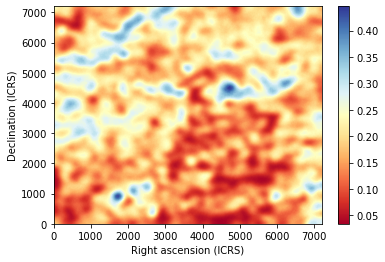

In [24]:
S.viewslice(F158.data)

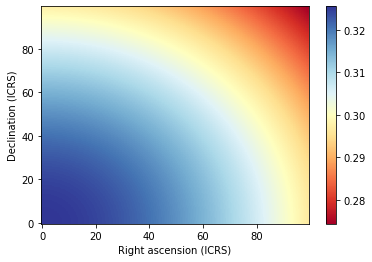

In [26]:
S.viewslice(smoothed_input_map[0:100,0:100])

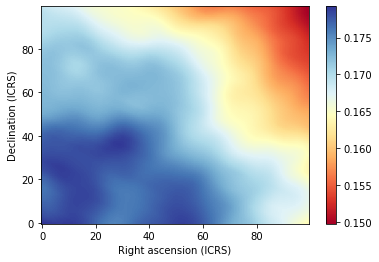

In [27]:
S.viewslice(F158.data[0:100,0:100])

### Simulate full freq bands

In [28]:
def do_simulation( freqlist, T, outdir ):
    T.output_dir = outdir
    for i in freqlist:
        sky = T.simulate(i, skytype='patch', smooth=False)
        print(sky)
        hdu = fits.open(sky[0])
        T.viewslice(hdu[0].data)

##### Low band

2022-08-13 13:26:50,442 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:50,445 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.00 [MHz] ...
2022-08-13 13:26:50,933 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:26:55,758 : simulate_frequency : INFO : Done simulate map at 120.00 [MHz].
2022-08-13 13:26:56,277 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_120.00.fits']


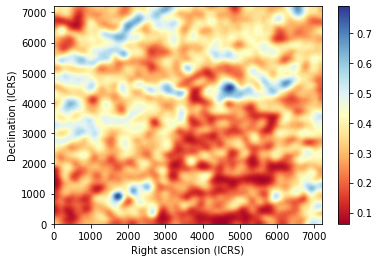

2022-08-13 13:26:58,144 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:26:58,145 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.16 [MHz] ...
2022-08-13 13:26:58,636 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:03,460 : simulate_frequency : INFO : Done simulate map at 120.16 [MHz].
2022-08-13 13:27:03,750 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_120.16.fits']


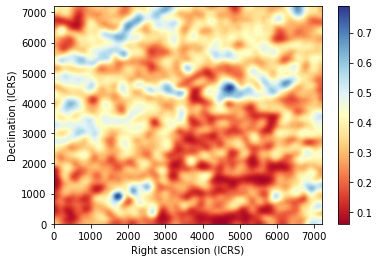

2022-08-13 13:27:05,629 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:05,631 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.32 [MHz] ...
2022-08-13 13:27:06,121 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:10,956 : simulate_frequency : INFO : Done simulate map at 120.32 [MHz].
2022-08-13 13:27:11,256 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_120.32.fits']


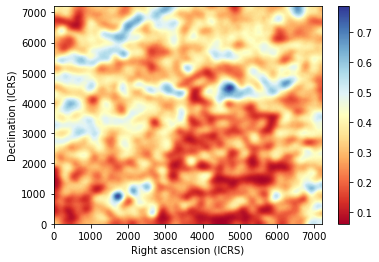

2022-08-13 13:27:13,188 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:13,190 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.48 [MHz] ...
2022-08-13 13:27:13,694 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:18,615 : simulate_frequency : INFO : Done simulate map at 120.48 [MHz].
2022-08-13 13:27:18,938 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_120.48.fits']


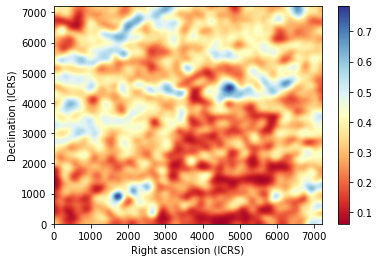

2022-08-13 13:27:20,817 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:20,819 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.64 [MHz] ...
2022-08-13 13:27:21,306 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:26,128 : simulate_frequency : INFO : Done simulate map at 120.64 [MHz].
2022-08-13 13:27:26,408 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_120.64.fits']


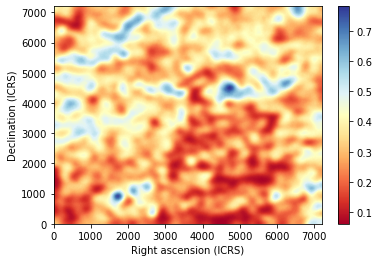

2022-08-13 13:27:28,313 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:28,315 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.80 [MHz] ...
2022-08-13 13:27:28,810 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:33,651 : simulate_frequency : INFO : Done simulate map at 120.80 [MHz].
2022-08-13 13:27:33,933 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_120.80.fits']


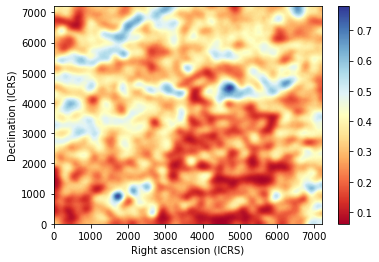

2022-08-13 13:27:35,827 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:35,829 : simulate_frequency : INFO : Simulating Galactic free-free map at 120.96 [MHz] ...
2022-08-13 13:27:36,316 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:41,148 : simulate_frequency : INFO : Done simulate map at 120.96 [MHz].
2022-08-13 13:27:41,440 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_120.96.fits']


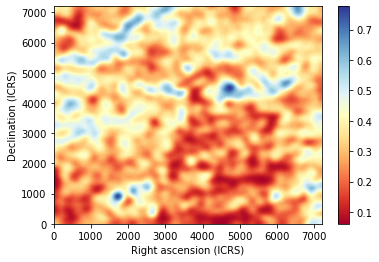

2022-08-13 13:27:43,339 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:43,341 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.12 [MHz] ...
2022-08-13 13:27:43,827 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:48,649 : simulate_frequency : INFO : Done simulate map at 121.12 [MHz].
2022-08-13 13:27:48,967 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_121.12.fits']


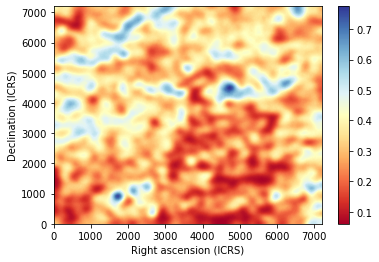

2022-08-13 13:27:50,844 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:50,846 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.28 [MHz] ...
2022-08-13 13:27:51,333 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:27:56,159 : simulate_frequency : INFO : Done simulate map at 121.28 [MHz].
2022-08-13 13:27:56,492 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_121.28.fits']


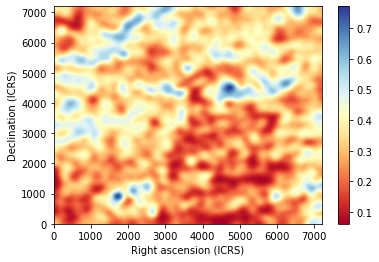

2022-08-13 13:27:58,374 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:27:58,376 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.44 [MHz] ...
2022-08-13 13:27:58,863 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:03,687 : simulate_frequency : INFO : Done simulate map at 121.44 [MHz].
2022-08-13 13:28:03,968 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_121.44.fits']


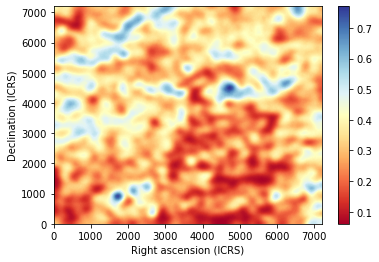

2022-08-13 13:28:05,850 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:05,852 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.60 [MHz] ...
2022-08-13 13:28:06,339 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:11,163 : simulate_frequency : INFO : Done simulate map at 121.60 [MHz].
2022-08-13 13:28:11,443 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_121.60.fits']


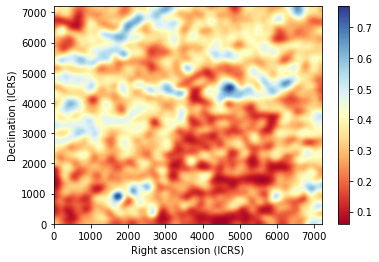

2022-08-13 13:28:13,520 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:13,522 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.76 [MHz] ...
2022-08-13 13:28:14,012 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:18,838 : simulate_frequency : INFO : Done simulate map at 121.76 [MHz].
2022-08-13 13:28:19,119 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_121.76.fits']


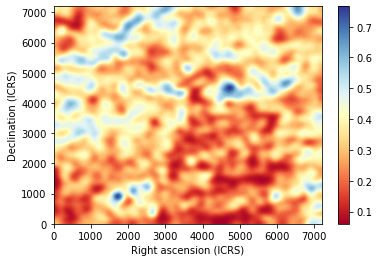

2022-08-13 13:28:20,989 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:20,991 : simulate_frequency : INFO : Simulating Galactic free-free map at 121.92 [MHz] ...
2022-08-13 13:28:21,481 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:26,304 : simulate_frequency : INFO : Done simulate map at 121.92 [MHz].
2022-08-13 13:28:26,627 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_121.92.fits']


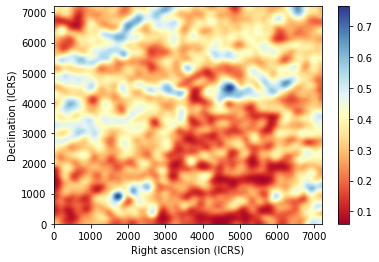

2022-08-13 13:28:28,512 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:28,514 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.08 [MHz] ...
2022-08-13 13:28:29,005 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:33,840 : simulate_frequency : INFO : Done simulate map at 122.08 [MHz].
2022-08-13 13:28:34,162 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_122.08.fits']


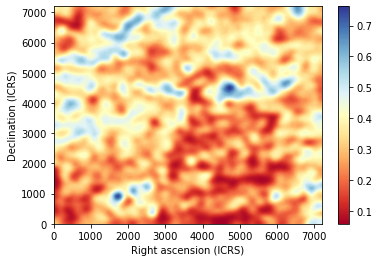

2022-08-13 13:28:36,041 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:36,043 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.24 [MHz] ...
2022-08-13 13:28:36,533 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:41,363 : simulate_frequency : INFO : Done simulate map at 122.24 [MHz].
2022-08-13 13:28:41,645 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_122.24.fits']


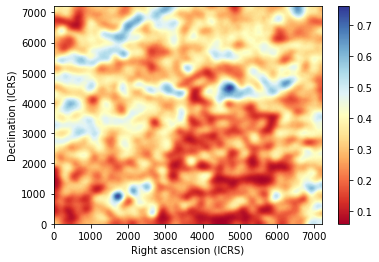

2022-08-13 13:28:43,526 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:43,528 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.40 [MHz] ...
2022-08-13 13:28:44,017 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:48,849 : simulate_frequency : INFO : Done simulate map at 122.40 [MHz].
2022-08-13 13:28:49,174 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_122.40.fits']


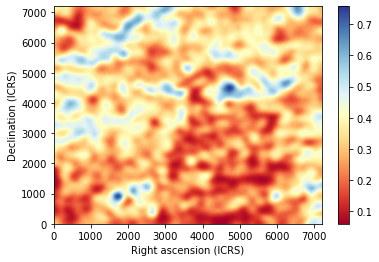

2022-08-13 13:28:51,052 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:51,054 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.56 [MHz] ...
2022-08-13 13:28:51,541 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:28:56,401 : simulate_frequency : INFO : Done simulate map at 122.56 [MHz].
2022-08-13 13:28:56,699 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_122.56.fits']


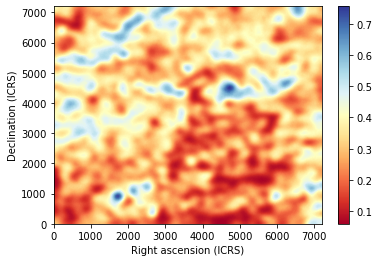

2022-08-13 13:28:58,624 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:28:58,626 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.72 [MHz] ...
2022-08-13 13:28:59,131 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:04,023 : simulate_frequency : INFO : Done simulate map at 122.72 [MHz].
2022-08-13 13:29:04,315 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_122.72.fits']


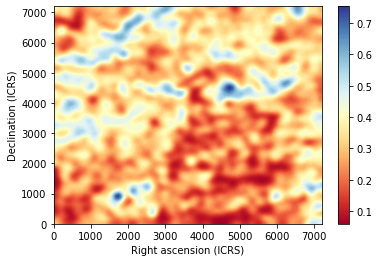

2022-08-13 13:29:06,207 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:06,209 : simulate_frequency : INFO : Simulating Galactic free-free map at 122.88 [MHz] ...
2022-08-13 13:29:06,697 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:11,528 : simulate_frequency : INFO : Done simulate map at 122.88 [MHz].
2022-08-13 13:29:11,809 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_122.88.fits']


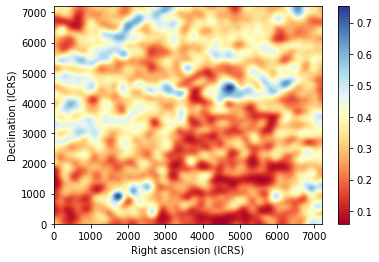

2022-08-13 13:29:13,688 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:13,690 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.04 [MHz] ...
2022-08-13 13:29:14,181 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:19,013 : simulate_frequency : INFO : Done simulate map at 123.04 [MHz].
2022-08-13 13:29:19,304 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_123.04.fits']


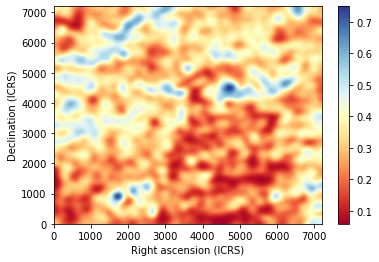

2022-08-13 13:29:21,195 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:21,196 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.20 [MHz] ...
2022-08-13 13:29:21,687 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:26,523 : simulate_frequency : INFO : Done simulate map at 123.20 [MHz].
2022-08-13 13:29:26,804 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_123.20.fits']


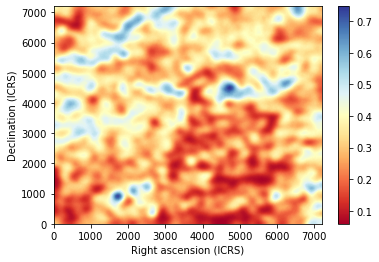

2022-08-13 13:29:28,679 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:28,681 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.36 [MHz] ...
2022-08-13 13:29:29,169 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:34,003 : simulate_frequency : INFO : Done simulate map at 123.36 [MHz].
2022-08-13 13:29:34,285 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_123.36.fits']


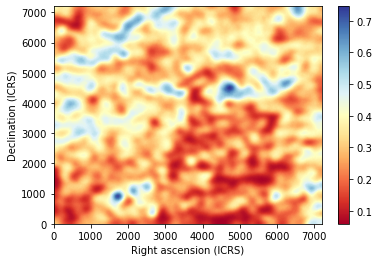

2022-08-13 13:29:36,369 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:36,371 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.52 [MHz] ...
2022-08-13 13:29:36,862 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:41,694 : simulate_frequency : INFO : Done simulate map at 123.52 [MHz].
2022-08-13 13:29:41,976 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_123.52.fits']


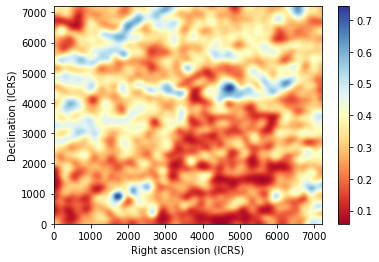

2022-08-13 13:29:43,852 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:43,854 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.68 [MHz] ...
2022-08-13 13:29:44,344 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:49,174 : simulate_frequency : INFO : Done simulate map at 123.68 [MHz].
2022-08-13 13:29:49,495 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_123.68.fits']


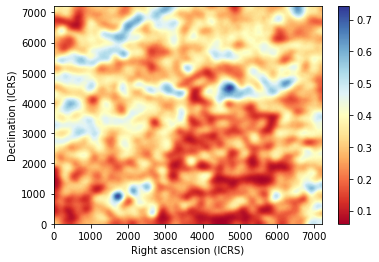

2022-08-13 13:29:51,374 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:51,376 : simulate_frequency : INFO : Simulating Galactic free-free map at 123.84 [MHz] ...
2022-08-13 13:29:51,866 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:29:56,699 : simulate_frequency : INFO : Done simulate map at 123.84 [MHz].
2022-08-13 13:29:56,980 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_123.84.fits']


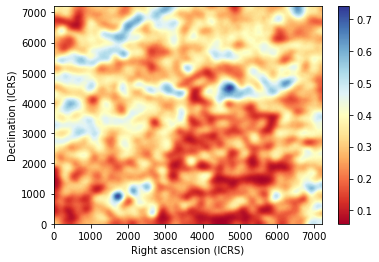

2022-08-13 13:29:58,866 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:29:58,868 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.00 [MHz] ...
2022-08-13 13:29:59,358 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:30:04,189 : simulate_frequency : INFO : Done simulate map at 124.00 [MHz].
2022-08-13 13:30:04,489 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_124.00.fits']


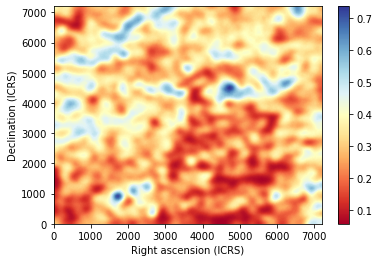

2022-08-13 13:30:06,369 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:30:06,371 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.16 [MHz] ...
2022-08-13 13:30:06,860 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:30:11,962 : simulate_frequency : INFO : Done simulate map at 124.16 [MHz].
2022-08-13 13:30:12,246 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_124.16.fits']


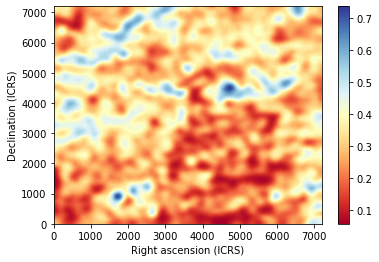

2022-08-13 13:30:14,138 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:30:14,139 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.32 [MHz] ...
2022-08-13 13:30:14,806 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:30:20,023 : simulate_frequency : INFO : Done simulate map at 124.32 [MHz].
2022-08-13 13:30:20,307 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_124.32.fits']


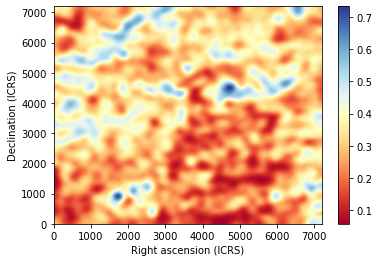

2022-08-13 13:30:22,203 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:30:22,204 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.48 [MHz] ...
2022-08-13 13:30:22,869 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:30:28,090 : simulate_frequency : INFO : Done simulate map at 124.48 [MHz].
2022-08-13 13:30:28,375 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_124.48.fits']


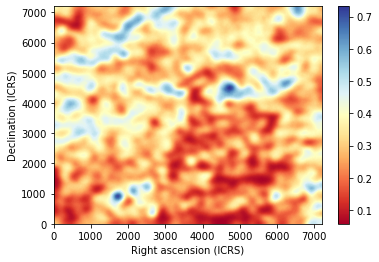

2022-08-13 13:30:30,271 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:30:30,272 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.64 [MHz] ...
2022-08-13 13:30:30,937 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:30:36,165 : simulate_frequency : INFO : Done simulate map at 124.64 [MHz].
2022-08-13 13:30:36,445 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_124.64.fits']


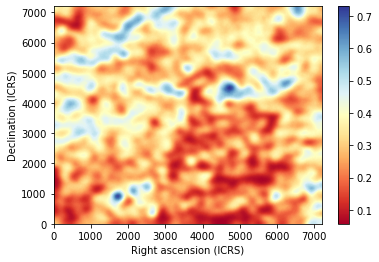

2022-08-13 13:30:38,343 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:30:38,344 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.80 [MHz] ...
2022-08-13 13:30:39,011 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:30:44,235 : simulate_frequency : INFO : Done simulate map at 124.80 [MHz].
2022-08-13 13:30:44,517 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_124.80.fits']


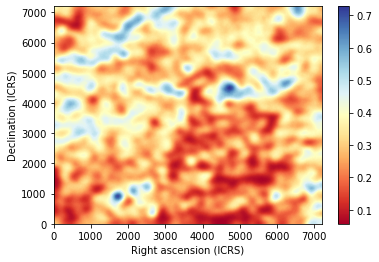

2022-08-13 13:30:46,409 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:30:46,410 : simulate_frequency : INFO : Simulating Galactic free-free map at 124.96 [MHz] ...
2022-08-13 13:30:47,075 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:30:52,301 : simulate_frequency : INFO : Done simulate map at 124.96 [MHz].
2022-08-13 13:30:52,583 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_124.96.fits']


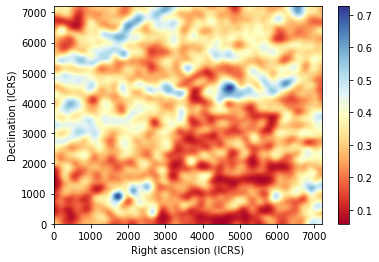

2022-08-13 13:30:54,477 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:30:54,478 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.12 [MHz] ...
2022-08-13 13:30:55,144 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:31:00,373 : simulate_frequency : INFO : Done simulate map at 125.12 [MHz].
2022-08-13 13:31:00,658 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_125.12.fits']


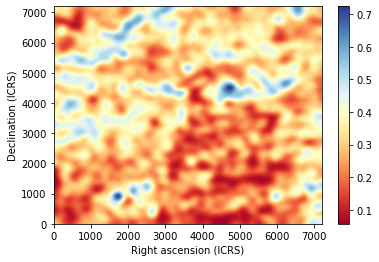

2022-08-13 13:31:02,917 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:31:02,918 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.28 [MHz] ...
2022-08-13 13:31:03,582 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:31:08,809 : simulate_frequency : INFO : Done simulate map at 125.28 [MHz].
2022-08-13 13:31:09,090 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_125.28.fits']


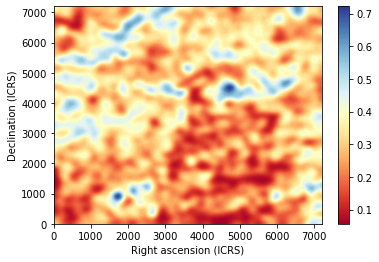

2022-08-13 13:31:10,986 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:31:10,987 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.44 [MHz] ...
2022-08-13 13:31:11,652 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:31:16,880 : simulate_frequency : INFO : Done simulate map at 125.44 [MHz].
2022-08-13 13:31:17,165 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_125.44.fits']


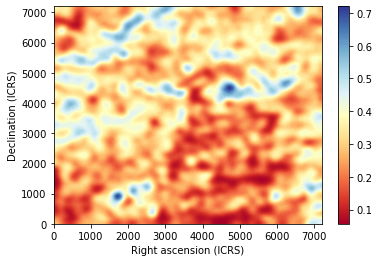

2022-08-13 13:31:19,068 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:31:19,071 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.60 [MHz] ...
2022-08-13 13:31:19,738 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:31:24,963 : simulate_frequency : INFO : Done simulate map at 125.60 [MHz].
2022-08-13 13:31:25,247 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_125.60.fits']


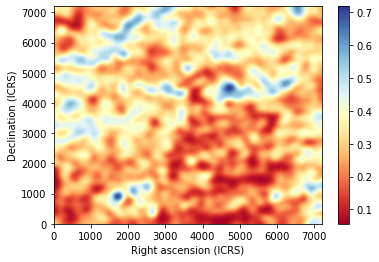

2022-08-13 13:31:27,150 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:31:27,151 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.76 [MHz] ...
2022-08-13 13:31:27,818 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:31:33,037 : simulate_frequency : INFO : Done simulate map at 125.76 [MHz].
2022-08-13 13:31:33,321 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_125.76.fits']


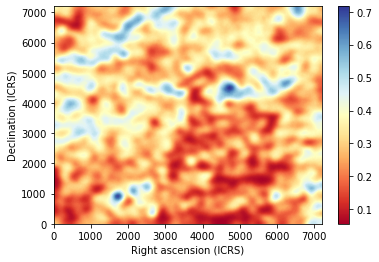

2022-08-13 13:31:35,220 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:31:35,221 : simulate_frequency : INFO : Simulating Galactic free-free map at 125.92 [MHz] ...
2022-08-13 13:31:35,888 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:31:41,111 : simulate_frequency : INFO : Done simulate map at 125.92 [MHz].
2022-08-13 13:31:41,394 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_125.92.fits']


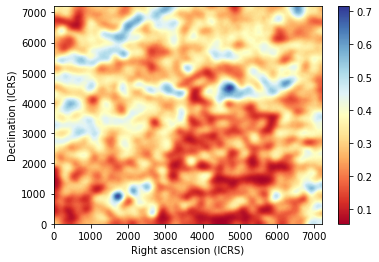

2022-08-13 13:31:43,525 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:31:43,527 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.08 [MHz] ...
2022-08-13 13:31:44,225 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:31:49,474 : simulate_frequency : INFO : Done simulate map at 126.08 [MHz].
2022-08-13 13:31:49,778 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_126.08.fits']


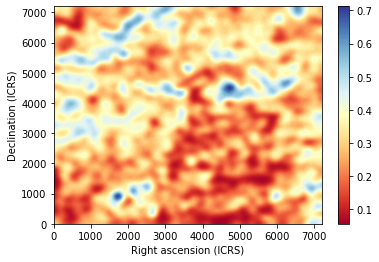

2022-08-13 13:31:51,667 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:31:51,669 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.24 [MHz] ...
2022-08-13 13:31:52,163 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:31:57,156 : simulate_frequency : INFO : Done simulate map at 126.24 [MHz].
2022-08-13 13:31:57,438 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_126.24.fits']


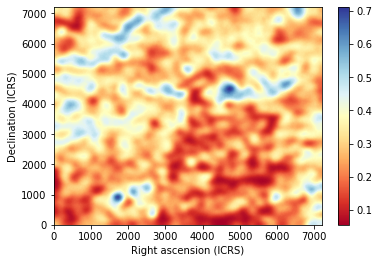

2022-08-13 13:31:59,316 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:31:59,317 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.40 [MHz] ...
2022-08-13 13:31:59,806 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:32:04,643 : simulate_frequency : INFO : Done simulate map at 126.40 [MHz].
2022-08-13 13:32:04,981 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_126.40.fits']


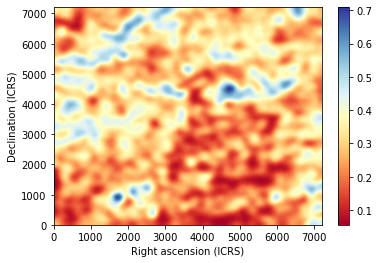

2022-08-13 13:32:06,857 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:32:06,859 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.56 [MHz] ...
2022-08-13 13:32:07,346 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:32:12,178 : simulate_frequency : INFO : Done simulate map at 126.56 [MHz].
2022-08-13 13:32:12,461 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_126.56.fits']


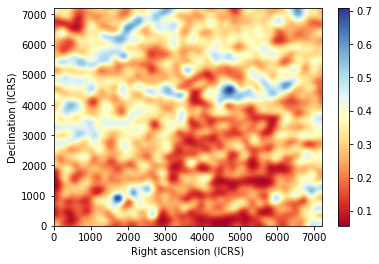

2022-08-13 13:32:14,339 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:32:14,340 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.72 [MHz] ...
2022-08-13 13:32:14,828 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:32:19,658 : simulate_frequency : INFO : Done simulate map at 126.72 [MHz].
2022-08-13 13:32:19,942 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_126.72.fits']


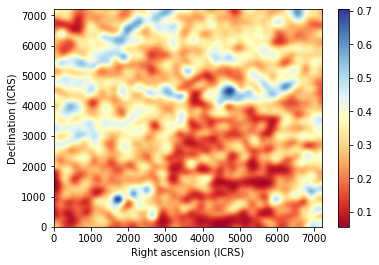

2022-08-13 13:32:21,821 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:32:21,822 : simulate_frequency : INFO : Simulating Galactic free-free map at 126.88 [MHz] ...
2022-08-13 13:32:22,312 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:32:27,141 : simulate_frequency : INFO : Done simulate map at 126.88 [MHz].
2022-08-13 13:32:27,422 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_126.88.fits']


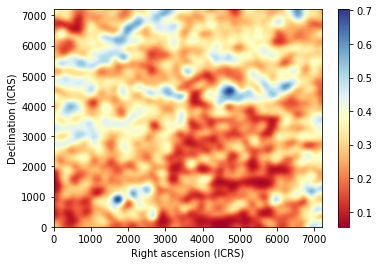

2022-08-13 13:32:29,555 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:32:29,557 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.04 [MHz] ...
2022-08-13 13:32:30,050 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:32:34,930 : simulate_frequency : INFO : Done simulate map at 127.04 [MHz].
2022-08-13 13:32:35,211 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_127.04.fits']


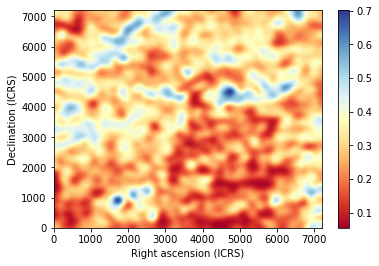

2022-08-13 13:32:37,085 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:32:37,087 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.20 [MHz] ...
2022-08-13 13:32:37,578 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:32:42,407 : simulate_frequency : INFO : Done simulate map at 127.20 [MHz].
2022-08-13 13:32:42,687 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_127.20.fits']


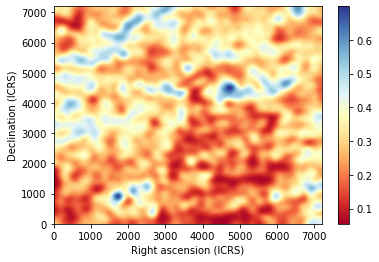

2022-08-13 13:32:44,632 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:32:44,634 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.36 [MHz] ...
2022-08-13 13:32:45,126 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:32:49,973 : simulate_frequency : INFO : Done simulate map at 127.36 [MHz].
2022-08-13 13:32:50,255 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_127.36.fits']


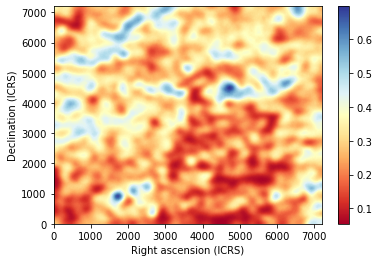

2022-08-13 13:32:52,131 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:32:52,133 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.52 [MHz] ...
2022-08-13 13:32:52,623 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:32:57,475 : simulate_frequency : INFO : Done simulate map at 127.52 [MHz].
2022-08-13 13:32:57,814 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_127.52.fits']


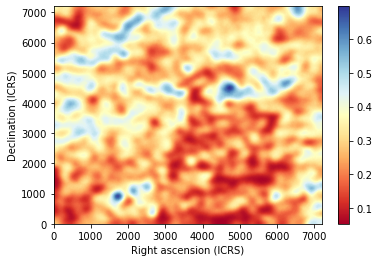

2022-08-13 13:32:59,696 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:32:59,698 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.68 [MHz] ...
2022-08-13 13:33:00,188 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:33:05,072 : simulate_frequency : INFO : Done simulate map at 127.68 [MHz].
2022-08-13 13:33:05,354 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_127.68.fits']


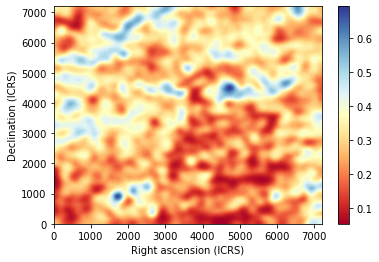

2022-08-13 13:33:07,228 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:33:07,230 : simulate_frequency : INFO : Simulating Galactic free-free map at 127.84 [MHz] ...
2022-08-13 13:33:07,717 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:33:12,547 : simulate_frequency : INFO : Done simulate map at 127.84 [MHz].
2022-08-13 13:33:12,830 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_127.84.fits']


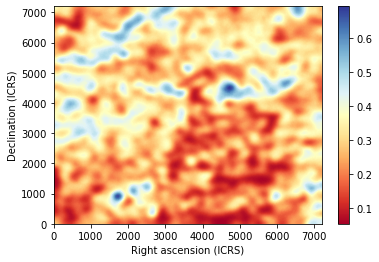

2022-08-13 13:33:14,702 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:33:14,704 : simulate_frequency : INFO : Simulating Galactic free-free map at 128.00 [MHz] ...
2022-08-13 13:33:15,191 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:33:20,019 : simulate_frequency : INFO : Done simulate map at 128.00 [MHz].
2022-08-13 13:33:20,299 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-low-120-128-FoV4/gfree_fov4_0-27_128.00.fits']


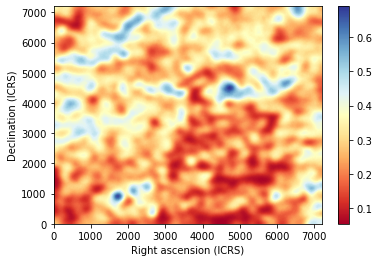

In [29]:
do_simulation(S.freqs['low']['f'], S, s_outlow)

##### Mid band

2022-08-13 13:33:22,185 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:33:22,188 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.00 [MHz] ...
2022-08-13 13:33:22,677 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:33:27,506 : simulate_frequency : INFO : Done simulate map at 154.00 [MHz].
2022-08-13 13:33:27,789 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_154.00.fits']


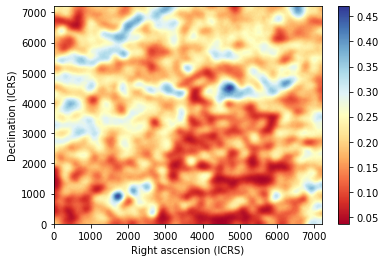

2022-08-13 13:33:29,671 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:33:29,673 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.16 [MHz] ...
2022-08-13 13:33:30,161 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:33:34,988 : simulate_frequency : INFO : Done simulate map at 154.16 [MHz].
2022-08-13 13:33:35,268 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_154.16.fits']


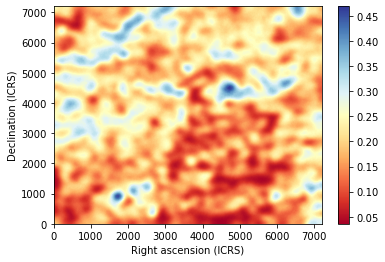

2022-08-13 13:33:37,150 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:33:37,151 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.32 [MHz] ...
2022-08-13 13:33:37,638 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:33:42,464 : simulate_frequency : INFO : Done simulate map at 154.32 [MHz].
2022-08-13 13:33:42,746 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_154.32.fits']


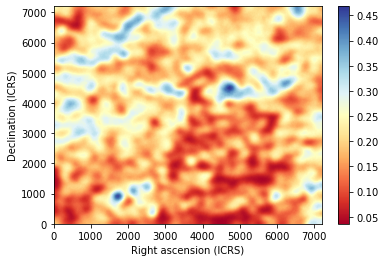

2022-08-13 13:33:44,631 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:33:44,632 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.48 [MHz] ...
2022-08-13 13:33:45,120 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:33:49,948 : simulate_frequency : INFO : Done simulate map at 154.48 [MHz].
2022-08-13 13:33:50,229 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_154.48.fits']


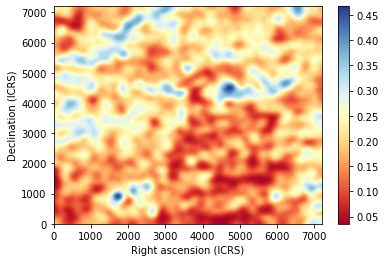

2022-08-13 13:33:52,319 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:33:52,321 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.64 [MHz] ...
2022-08-13 13:33:52,814 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:33:57,645 : simulate_frequency : INFO : Done simulate map at 154.64 [MHz].
2022-08-13 13:33:57,928 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_154.64.fits']


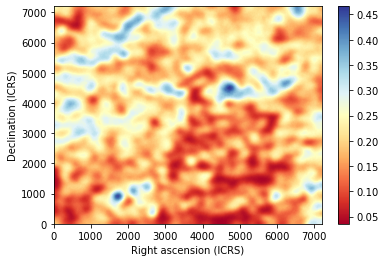

2022-08-13 13:33:59,818 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:33:59,819 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.80 [MHz] ...
2022-08-13 13:34:00,312 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:34:05,186 : simulate_frequency : INFO : Done simulate map at 154.80 [MHz].
2022-08-13 13:34:05,467 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_154.80.fits']


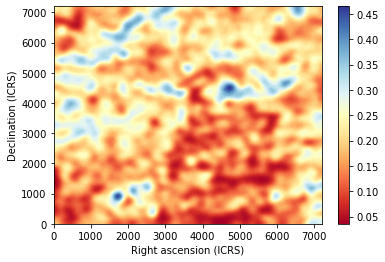

2022-08-13 13:34:07,353 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:34:07,355 : simulate_frequency : INFO : Simulating Galactic free-free map at 154.96 [MHz] ...
2022-08-13 13:34:07,843 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:34:12,668 : simulate_frequency : INFO : Done simulate map at 154.96 [MHz].
2022-08-13 13:34:13,070 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_154.96.fits']


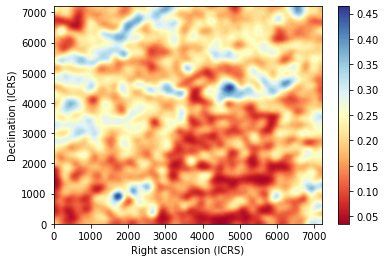

2022-08-13 13:34:14,955 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:34:14,956 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.12 [MHz] ...
2022-08-13 13:34:15,445 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:34:20,268 : simulate_frequency : INFO : Done simulate map at 155.12 [MHz].
2022-08-13 13:34:20,562 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_155.12.fits']


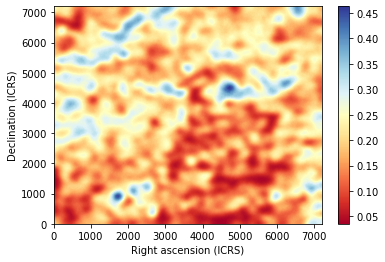

2022-08-13 13:34:22,448 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:34:22,449 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.28 [MHz] ...
2022-08-13 13:34:22,938 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:34:27,858 : simulate_frequency : INFO : Done simulate map at 155.28 [MHz].
2022-08-13 13:34:28,150 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_155.28.fits']


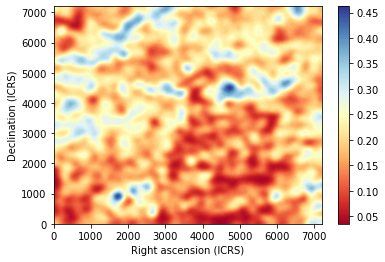

2022-08-13 13:34:30,039 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:34:30,041 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.44 [MHz] ...
2022-08-13 13:34:30,530 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:34:35,355 : simulate_frequency : INFO : Done simulate map at 155.44 [MHz].
2022-08-13 13:34:35,695 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_155.44.fits']


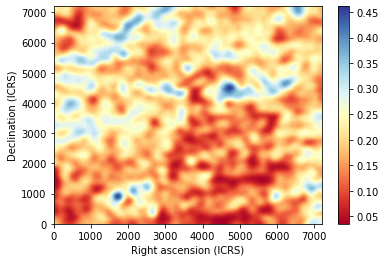

2022-08-13 13:34:37,596 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:34:37,597 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.60 [MHz] ...
2022-08-13 13:34:38,085 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:34:43,025 : simulate_frequency : INFO : Done simulate map at 155.60 [MHz].
2022-08-13 13:34:43,305 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_155.60.fits']


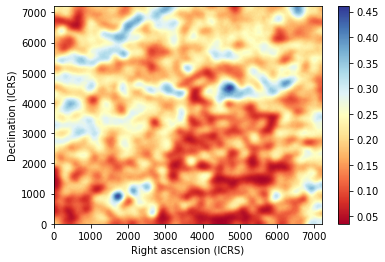

2022-08-13 13:34:45,195 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:34:45,196 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.76 [MHz] ...
2022-08-13 13:34:45,742 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:34:50,994 : simulate_frequency : INFO : Done simulate map at 155.76 [MHz].
2022-08-13 13:34:51,276 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_155.76.fits']


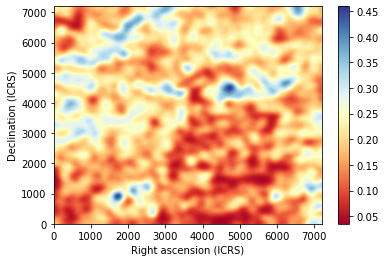

2022-08-13 13:34:53,163 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:34:53,165 : simulate_frequency : INFO : Simulating Galactic free-free map at 155.92 [MHz] ...
2022-08-13 13:34:53,655 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:34:58,481 : simulate_frequency : INFO : Done simulate map at 155.92 [MHz].
2022-08-13 13:34:58,776 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_155.92.fits']


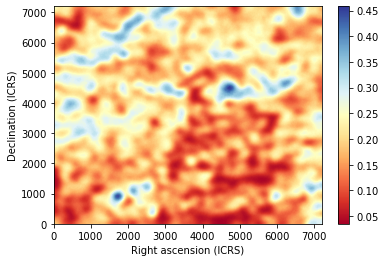

2022-08-13 13:35:00,658 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:35:00,659 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.08 [MHz] ...
2022-08-13 13:35:01,146 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:35:05,972 : simulate_frequency : INFO : Done simulate map at 156.08 [MHz].
2022-08-13 13:35:06,292 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_156.08.fits']


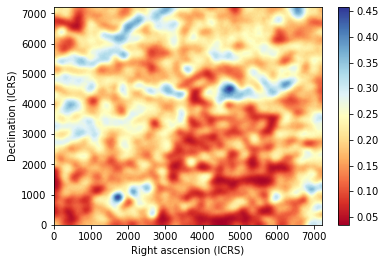

2022-08-13 13:35:08,187 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:35:08,189 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.24 [MHz] ...
2022-08-13 13:35:08,677 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:35:13,508 : simulate_frequency : INFO : Done simulate map at 156.24 [MHz].
2022-08-13 13:35:13,803 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_156.24.fits']


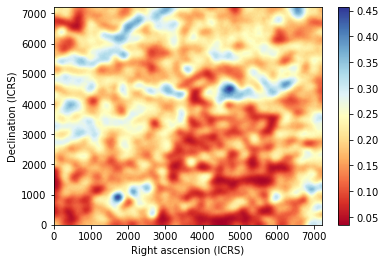

2022-08-13 13:35:15,894 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:35:15,895 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.40 [MHz] ...
2022-08-13 13:35:16,387 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:35:21,220 : simulate_frequency : INFO : Done simulate map at 156.40 [MHz].
2022-08-13 13:35:21,503 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_156.40.fits']


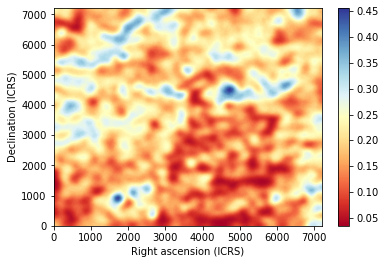

2022-08-13 13:35:23,387 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:35:23,389 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.56 [MHz] ...
2022-08-13 13:35:23,880 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:35:28,711 : simulate_frequency : INFO : Done simulate map at 156.56 [MHz].
2022-08-13 13:35:29,003 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_156.56.fits']


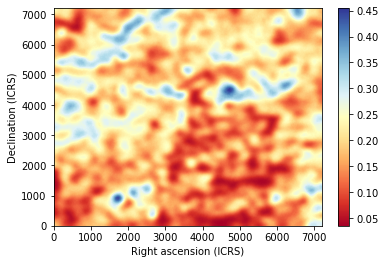

2022-08-13 13:35:30,891 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:35:30,892 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.72 [MHz] ...
2022-08-13 13:35:31,383 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:35:36,212 : simulate_frequency : INFO : Done simulate map at 156.72 [MHz].
2022-08-13 13:35:36,492 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_156.72.fits']


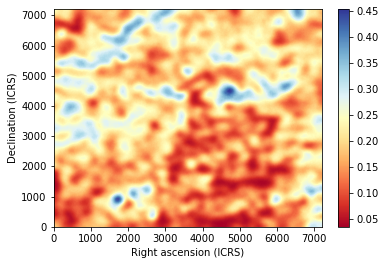

2022-08-13 13:35:38,385 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:35:38,386 : simulate_frequency : INFO : Simulating Galactic free-free map at 156.88 [MHz] ...
2022-08-13 13:35:38,876 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:35:43,701 : simulate_frequency : INFO : Done simulate map at 156.88 [MHz].
2022-08-13 13:35:43,983 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_156.88.fits']


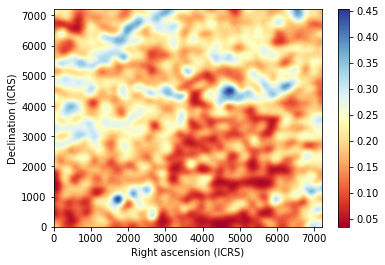

2022-08-13 13:35:45,871 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:35:45,872 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.04 [MHz] ...
2022-08-13 13:35:46,362 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:35:51,189 : simulate_frequency : INFO : Done simulate map at 157.04 [MHz].
2022-08-13 13:35:51,472 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_157.04.fits']


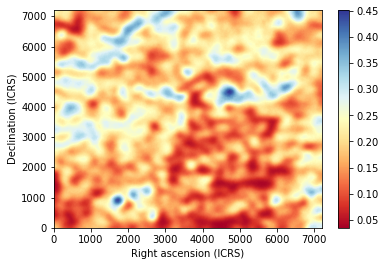

2022-08-13 13:35:53,366 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:35:53,368 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.20 [MHz] ...
2022-08-13 13:35:53,857 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:35:58,680 : simulate_frequency : INFO : Done simulate map at 157.20 [MHz].
2022-08-13 13:35:58,962 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_157.20.fits']


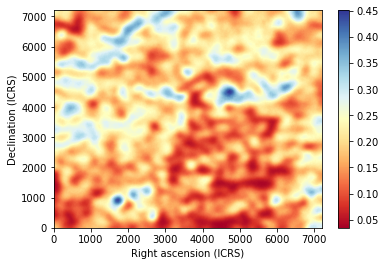

2022-08-13 13:36:00,849 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:36:00,851 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.36 [MHz] ...
2022-08-13 13:36:01,490 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:36:06,848 : simulate_frequency : INFO : Done simulate map at 157.36 [MHz].
2022-08-13 13:36:07,132 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_157.36.fits']


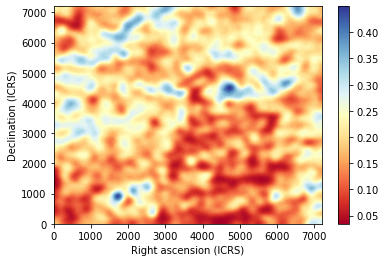

2022-08-13 13:36:09,034 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:36:09,036 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.52 [MHz] ...
2022-08-13 13:36:10,144 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:36:15,499 : simulate_frequency : INFO : Done simulate map at 157.52 [MHz].
2022-08-13 13:36:15,782 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_157.52.fits']


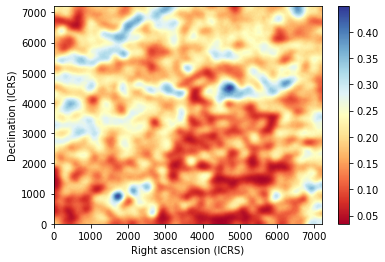

2022-08-13 13:36:17,683 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:36:17,685 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.68 [MHz] ...
2022-08-13 13:36:18,704 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:36:24,102 : simulate_frequency : INFO : Done simulate map at 157.68 [MHz].
2022-08-13 13:36:24,385 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_157.68.fits']


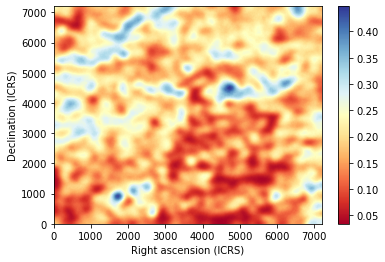

2022-08-13 13:36:26,282 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:36:26,284 : simulate_frequency : INFO : Simulating Galactic free-free map at 157.84 [MHz] ...
2022-08-13 13:36:26,950 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:36:32,172 : simulate_frequency : INFO : Done simulate map at 157.84 [MHz].
2022-08-13 13:36:32,453 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_157.84.fits']


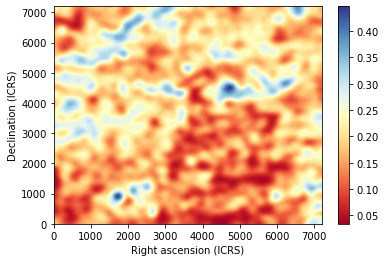

2022-08-13 13:36:34,355 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:36:34,357 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.00 [MHz] ...
2022-08-13 13:36:35,024 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:36:40,525 : simulate_frequency : INFO : Done simulate map at 158.00 [MHz].
2022-08-13 13:36:40,809 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_158.00.fits']


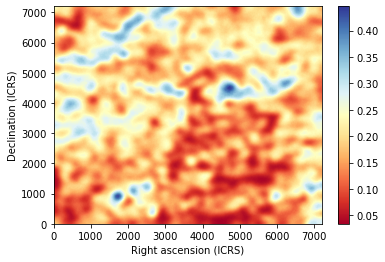

2022-08-13 13:36:43,308 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:36:43,309 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.16 [MHz] ...
2022-08-13 13:36:43,977 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:36:49,214 : simulate_frequency : INFO : Done simulate map at 158.16 [MHz].
2022-08-13 13:36:49,501 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_158.16.fits']


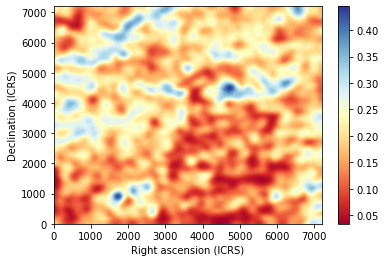

2022-08-13 13:36:51,404 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:36:51,405 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.32 [MHz] ...
2022-08-13 13:36:52,071 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:36:57,295 : simulate_frequency : INFO : Done simulate map at 158.32 [MHz].
2022-08-13 13:36:57,695 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_158.32.fits']


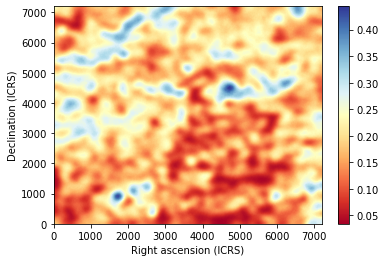

2022-08-13 13:36:59,592 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:36:59,593 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.48 [MHz] ...
2022-08-13 13:37:00,260 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:37:05,481 : simulate_frequency : INFO : Done simulate map at 158.48 [MHz].
2022-08-13 13:37:05,764 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_158.48.fits']


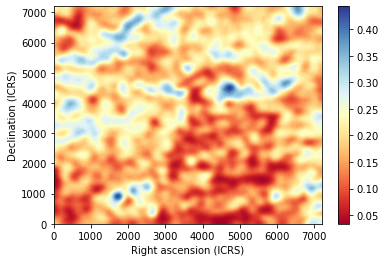

2022-08-13 13:37:07,669 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:37:07,671 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.64 [MHz] ...
2022-08-13 13:37:08,339 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:37:13,567 : simulate_frequency : INFO : Done simulate map at 158.64 [MHz].
2022-08-13 13:37:13,850 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_158.64.fits']


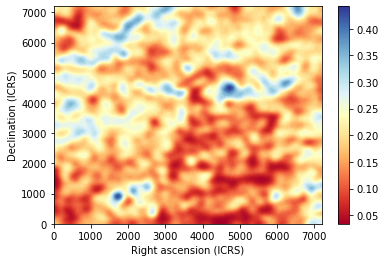

2022-08-13 13:37:15,751 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:37:15,753 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.80 [MHz] ...
2022-08-13 13:37:16,419 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:37:21,645 : simulate_frequency : INFO : Done simulate map at 158.80 [MHz].
2022-08-13 13:37:21,929 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_158.80.fits']


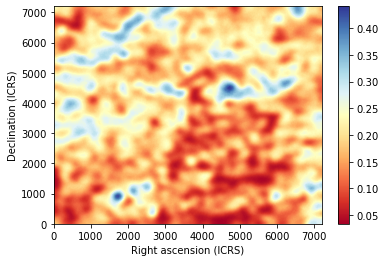

2022-08-13 13:37:23,830 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:37:23,832 : simulate_frequency : INFO : Simulating Galactic free-free map at 158.96 [MHz] ...
2022-08-13 13:37:24,502 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:37:29,726 : simulate_frequency : INFO : Done simulate map at 158.96 [MHz].
2022-08-13 13:37:30,083 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_158.96.fits']


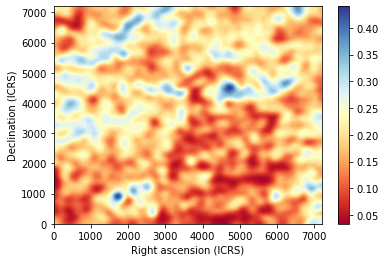

2022-08-13 13:37:31,987 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:37:31,988 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.12 [MHz] ...
2022-08-13 13:37:32,655 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:37:37,881 : simulate_frequency : INFO : Done simulate map at 159.12 [MHz].
2022-08-13 13:37:38,164 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_159.12.fits']


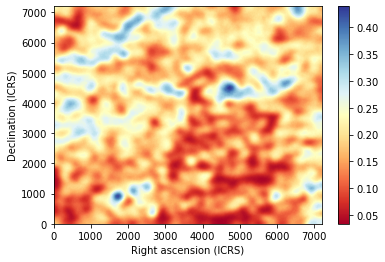

2022-08-13 13:37:40,065 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:37:40,067 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.28 [MHz] ...
2022-08-13 13:37:40,739 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:37:46,042 : simulate_frequency : INFO : Done simulate map at 159.28 [MHz].
2022-08-13 13:37:46,325 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_159.28.fits']


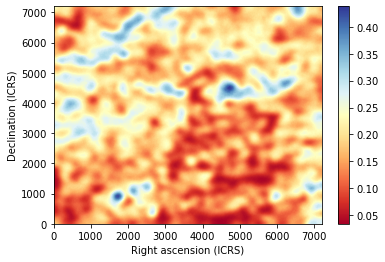

2022-08-13 13:37:48,227 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:37:48,228 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.44 [MHz] ...
2022-08-13 13:37:48,896 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:37:54,127 : simulate_frequency : INFO : Done simulate map at 159.44 [MHz].
2022-08-13 13:37:54,415 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_159.44.fits']


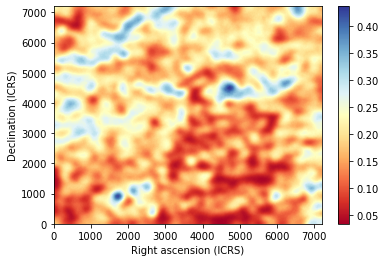

2022-08-13 13:37:56,606 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:37:56,608 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.60 [MHz] ...
2022-08-13 13:37:57,388 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:38:02,787 : simulate_frequency : INFO : Done simulate map at 159.60 [MHz].
2022-08-13 13:38:03,156 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_159.60.fits']


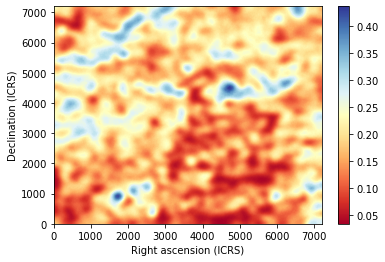

2022-08-13 13:38:05,073 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:38:05,075 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.76 [MHz] ...
2022-08-13 13:38:05,821 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:38:11,185 : simulate_frequency : INFO : Done simulate map at 159.76 [MHz].
2022-08-13 13:38:11,472 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_159.76.fits']


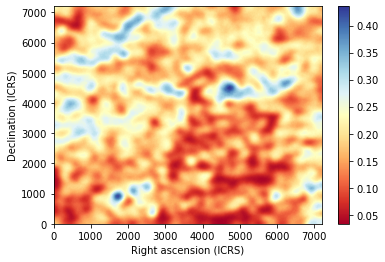

2022-08-13 13:38:13,952 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:38:13,954 : simulate_frequency : INFO : Simulating Galactic free-free map at 159.92 [MHz] ...
2022-08-13 13:38:14,699 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:38:20,069 : simulate_frequency : INFO : Done simulate map at 159.92 [MHz].
2022-08-13 13:38:20,394 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_159.92.fits']


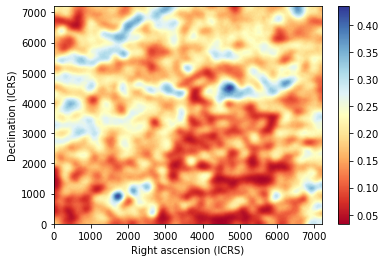

2022-08-13 13:38:22,307 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:38:22,309 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.08 [MHz] ...
2022-08-13 13:38:23,054 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:38:28,416 : simulate_frequency : INFO : Done simulate map at 160.08 [MHz].
2022-08-13 13:38:28,753 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_160.08.fits']


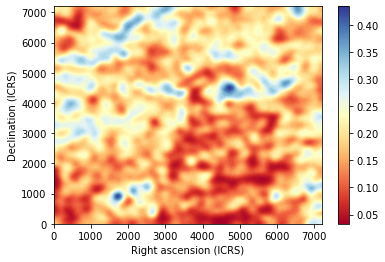

2022-08-13 13:38:30,674 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:38:30,676 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.24 [MHz] ...
2022-08-13 13:38:31,423 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:38:36,788 : simulate_frequency : INFO : Done simulate map at 160.24 [MHz].
2022-08-13 13:38:37,089 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_160.24.fits']


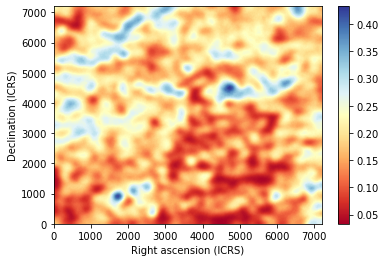

2022-08-13 13:38:39,011 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:38:39,013 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.40 [MHz] ...
2022-08-13 13:38:39,759 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:38:45,122 : simulate_frequency : INFO : Done simulate map at 160.40 [MHz].
2022-08-13 13:38:45,445 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_160.40.fits']


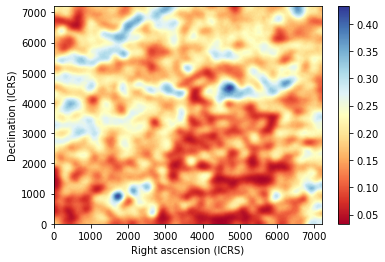

2022-08-13 13:38:47,370 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:38:47,372 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.56 [MHz] ...
2022-08-13 13:38:48,129 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:38:53,497 : simulate_frequency : INFO : Done simulate map at 160.56 [MHz].
2022-08-13 13:38:53,833 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_160.56.fits']


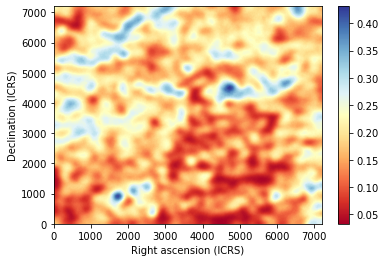

2022-08-13 13:38:55,750 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:38:55,752 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.72 [MHz] ...
2022-08-13 13:38:56,498 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:39:01,864 : simulate_frequency : INFO : Done simulate map at 160.72 [MHz].
2022-08-13 13:39:02,148 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_160.72.fits']


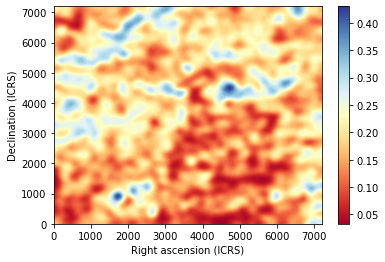

2022-08-13 13:39:04,069 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:39:04,071 : simulate_frequency : INFO : Simulating Galactic free-free map at 160.88 [MHz] ...
2022-08-13 13:39:04,816 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:39:10,183 : simulate_frequency : INFO : Done simulate map at 160.88 [MHz].
2022-08-13 13:39:10,473 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_160.88.fits']


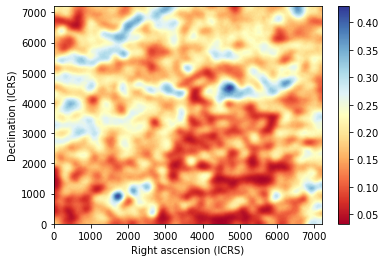

2022-08-13 13:39:12,389 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:39:12,391 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.04 [MHz] ...
2022-08-13 13:39:13,138 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:39:18,504 : simulate_frequency : INFO : Done simulate map at 161.04 [MHz].
2022-08-13 13:39:18,786 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_161.04.fits']


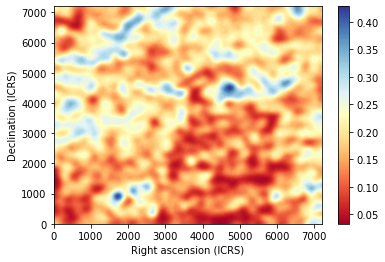

2022-08-13 13:39:20,700 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:39:20,702 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.20 [MHz] ...
2022-08-13 13:39:21,448 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:39:26,814 : simulate_frequency : INFO : Done simulate map at 161.20 [MHz].
2022-08-13 13:39:27,099 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_161.20.fits']


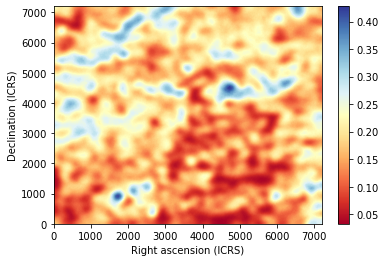

2022-08-13 13:39:29,012 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:39:29,014 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.36 [MHz] ...
2022-08-13 13:39:29,761 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:39:35,125 : simulate_frequency : INFO : Done simulate map at 161.36 [MHz].
2022-08-13 13:39:35,408 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_161.36.fits']


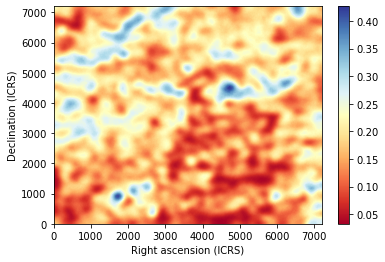

2022-08-13 13:39:37,325 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:39:37,327 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.52 [MHz] ...
2022-08-13 13:39:38,073 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:39:43,435 : simulate_frequency : INFO : Done simulate map at 161.52 [MHz].
2022-08-13 13:39:43,718 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_161.52.fits']


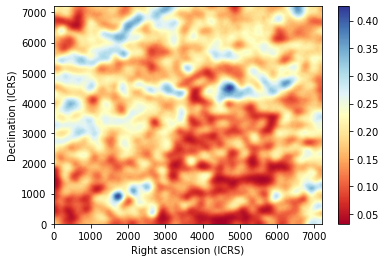

2022-08-13 13:39:46,170 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:39:46,172 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.68 [MHz] ...
2022-08-13 13:39:46,915 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:39:52,281 : simulate_frequency : INFO : Done simulate map at 161.68 [MHz].
2022-08-13 13:39:52,681 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_161.68.fits']


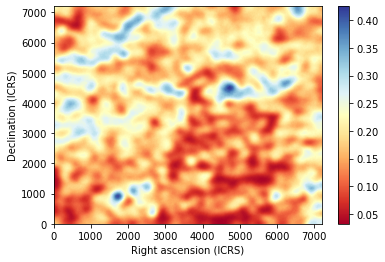

2022-08-13 13:39:54,592 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:39:54,594 : simulate_frequency : INFO : Simulating Galactic free-free map at 161.84 [MHz] ...
2022-08-13 13:39:55,338 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:40:00,703 : simulate_frequency : INFO : Done simulate map at 161.84 [MHz].
2022-08-13 13:40:00,988 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_161.84.fits']


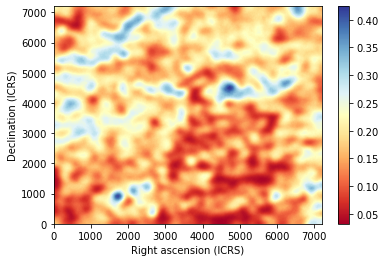

2022-08-13 13:40:02,905 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:40:02,907 : simulate_frequency : INFO : Simulating Galactic free-free map at 162.00 [MHz] ...
2022-08-13 13:40:03,653 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:40:09,017 : simulate_frequency : INFO : Done simulate map at 162.00 [MHz].
2022-08-13 13:40:09,301 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-mid-154-162-FoV4/gfree_fov4_0-27_162.00.fits']


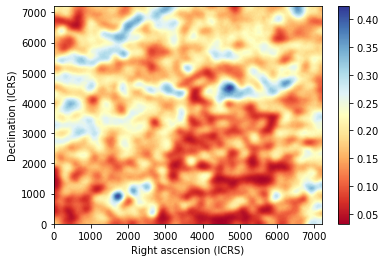

In [30]:
do_simulation(S.freqs['mid']['f'], S, s_outmid)

##### hig band

2022-08-13 13:40:11,239 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:40:11,241 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.00 [MHz] ...
2022-08-13 13:40:11,987 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:40:17,353 : simulate_frequency : INFO : Done simulate map at 188.00 [MHz].
2022-08-13 13:40:18,041 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_188.00.fits']


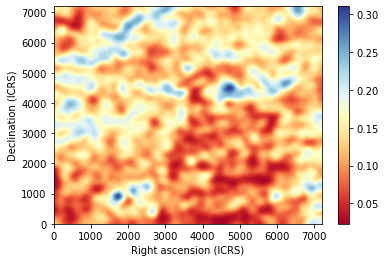

2022-08-13 13:40:19,946 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:40:19,948 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.16 [MHz] ...
2022-08-13 13:40:20,695 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:40:26,063 : simulate_frequency : INFO : Done simulate map at 188.16 [MHz].
2022-08-13 13:40:26,348 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_188.16.fits']


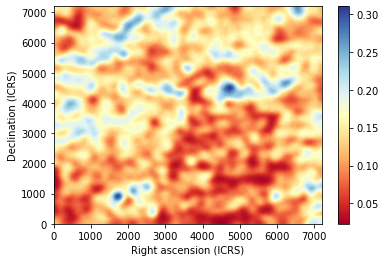

2022-08-13 13:40:28,255 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:40:28,257 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.32 [MHz] ...
2022-08-13 13:40:29,003 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:40:34,372 : simulate_frequency : INFO : Done simulate map at 188.32 [MHz].
2022-08-13 13:40:34,656 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_188.32.fits']


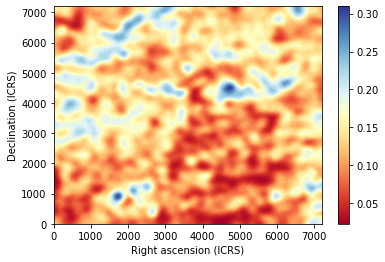

2022-08-13 13:40:36,567 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:40:36,569 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.48 [MHz] ...
2022-08-13 13:40:37,317 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:40:42,686 : simulate_frequency : INFO : Done simulate map at 188.48 [MHz].
2022-08-13 13:40:42,974 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_188.48.fits']


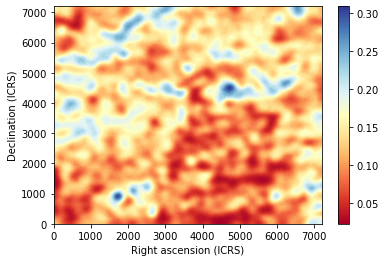

2022-08-13 13:40:44,882 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:40:44,884 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.64 [MHz] ...
2022-08-13 13:40:45,630 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:40:50,998 : simulate_frequency : INFO : Done simulate map at 188.64 [MHz].
2022-08-13 13:40:51,281 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_188.64.fits']


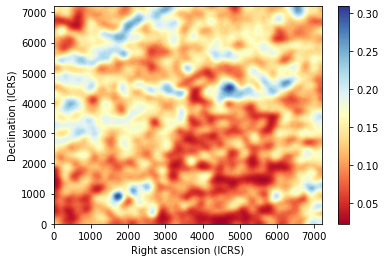

2022-08-13 13:40:53,187 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:40:53,189 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.80 [MHz] ...
2022-08-13 13:40:53,935 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:40:59,307 : simulate_frequency : INFO : Done simulate map at 188.80 [MHz].
2022-08-13 13:40:59,589 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_188.80.fits']


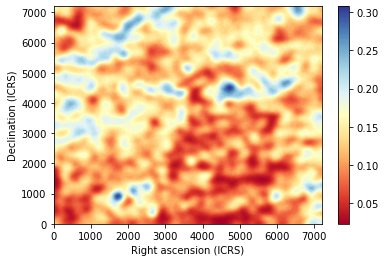

2022-08-13 13:41:01,498 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:41:01,500 : simulate_frequency : INFO : Simulating Galactic free-free map at 188.96 [MHz] ...
2022-08-13 13:41:02,247 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:41:07,615 : simulate_frequency : INFO : Done simulate map at 188.96 [MHz].
2022-08-13 13:41:07,898 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_188.96.fits']


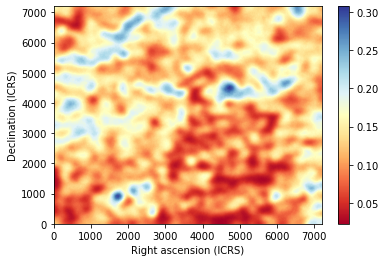

2022-08-13 13:41:09,803 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:41:09,805 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.12 [MHz] ...
2022-08-13 13:41:10,555 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:41:15,921 : simulate_frequency : INFO : Done simulate map at 189.12 [MHz].
2022-08-13 13:41:16,204 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_189.12.fits']


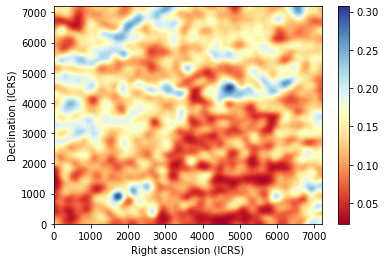

2022-08-13 13:41:18,652 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:41:18,654 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.28 [MHz] ...
2022-08-13 13:41:19,398 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:41:24,767 : simulate_frequency : INFO : Done simulate map at 189.28 [MHz].
2022-08-13 13:41:25,052 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_189.28.fits']


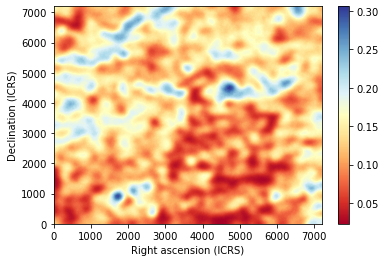

2022-08-13 13:41:26,962 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:41:26,964 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.44 [MHz] ...
2022-08-13 13:41:27,713 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:41:33,083 : simulate_frequency : INFO : Done simulate map at 189.44 [MHz].
2022-08-13 13:41:33,368 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_189.44.fits']


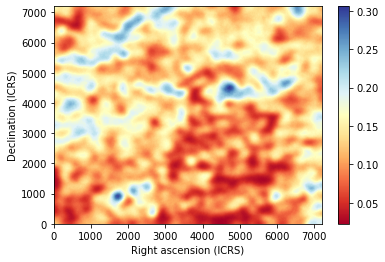

2022-08-13 13:41:35,275 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:41:35,278 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.60 [MHz] ...
2022-08-13 13:41:36,025 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:41:41,395 : simulate_frequency : INFO : Done simulate map at 189.60 [MHz].
2022-08-13 13:41:41,680 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_189.60.fits']


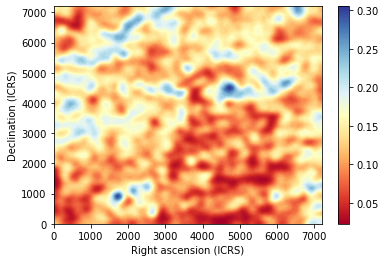

2022-08-13 13:41:43,591 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:41:43,593 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.76 [MHz] ...
2022-08-13 13:41:44,340 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:41:49,706 : simulate_frequency : INFO : Done simulate map at 189.76 [MHz].
2022-08-13 13:41:49,991 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_189.76.fits']


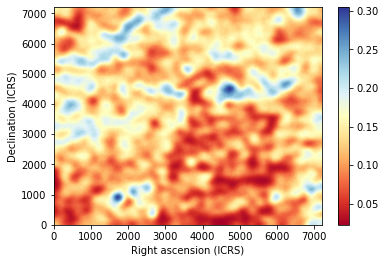

2022-08-13 13:41:51,901 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:41:51,903 : simulate_frequency : INFO : Simulating Galactic free-free map at 189.92 [MHz] ...
2022-08-13 13:41:52,650 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:41:58,021 : simulate_frequency : INFO : Done simulate map at 189.92 [MHz].
2022-08-13 13:41:58,305 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_189.92.fits']


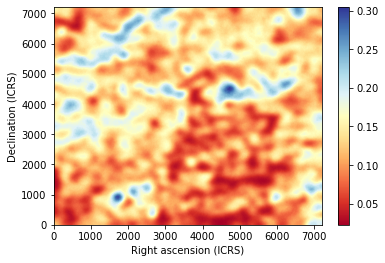

2022-08-13 13:42:00,214 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:42:00,216 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.08 [MHz] ...
2022-08-13 13:42:00,962 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:42:06,331 : simulate_frequency : INFO : Done simulate map at 190.08 [MHz].
2022-08-13 13:42:06,614 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_190.08.fits']


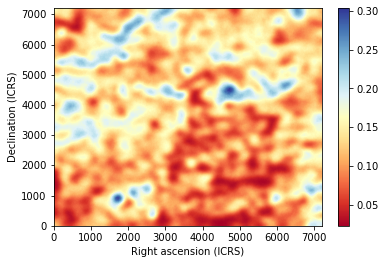

2022-08-13 13:42:08,521 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:42:08,523 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.24 [MHz] ...
2022-08-13 13:42:09,270 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:42:14,637 : simulate_frequency : INFO : Done simulate map at 190.24 [MHz].
2022-08-13 13:42:14,922 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_190.24.fits']


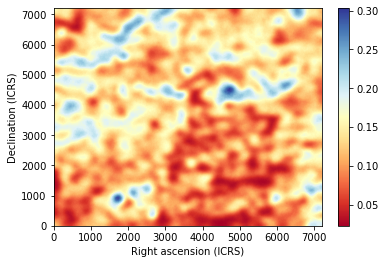

2022-08-13 13:42:16,831 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:42:16,833 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.40 [MHz] ...
2022-08-13 13:42:17,579 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:42:22,948 : simulate_frequency : INFO : Done simulate map at 190.40 [MHz].
2022-08-13 13:42:23,231 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_190.40.fits']


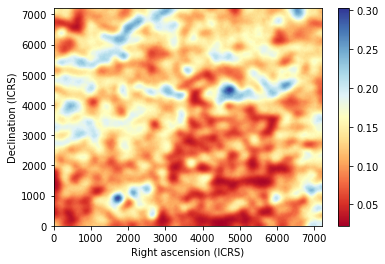

2022-08-13 13:42:25,140 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:42:25,142 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.56 [MHz] ...
2022-08-13 13:42:25,890 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:42:31,305 : simulate_frequency : INFO : Done simulate map at 190.56 [MHz].
2022-08-13 13:42:31,588 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_190.56.fits']


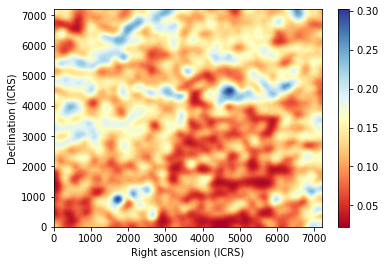

2022-08-13 13:42:33,495 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:42:33,497 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.72 [MHz] ...
2022-08-13 13:42:34,244 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:42:39,613 : simulate_frequency : INFO : Done simulate map at 190.72 [MHz].
2022-08-13 13:42:39,898 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_190.72.fits']


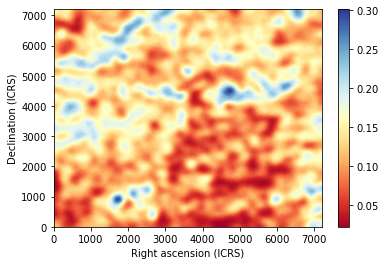

2022-08-13 13:42:41,805 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:42:41,807 : simulate_frequency : INFO : Simulating Galactic free-free map at 190.88 [MHz] ...
2022-08-13 13:42:42,557 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:42:47,925 : simulate_frequency : INFO : Done simulate map at 190.88 [MHz].
2022-08-13 13:42:48,238 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_190.88.fits']


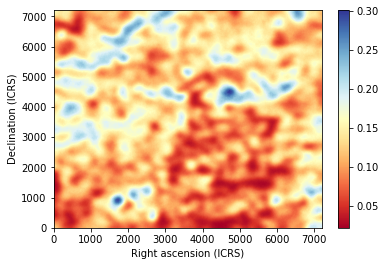

2022-08-13 13:42:50,686 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:42:50,688 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.04 [MHz] ...
2022-08-13 13:42:51,432 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:42:56,799 : simulate_frequency : INFO : Done simulate map at 191.04 [MHz].
2022-08-13 13:42:57,085 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_191.04.fits']


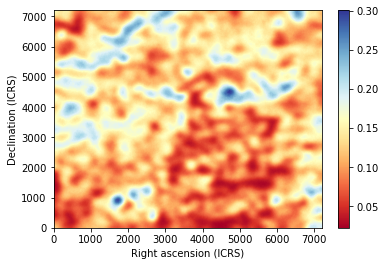

2022-08-13 13:42:58,994 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:42:58,996 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.20 [MHz] ...
2022-08-13 13:42:59,743 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:43:05,114 : simulate_frequency : INFO : Done simulate map at 191.20 [MHz].
2022-08-13 13:43:05,439 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_191.20.fits']


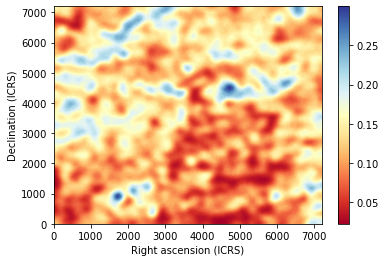

2022-08-13 13:43:07,341 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:43:07,343 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.36 [MHz] ...
2022-08-13 13:43:08,089 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:43:13,453 : simulate_frequency : INFO : Done simulate map at 191.36 [MHz].
2022-08-13 13:43:13,753 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_191.36.fits']


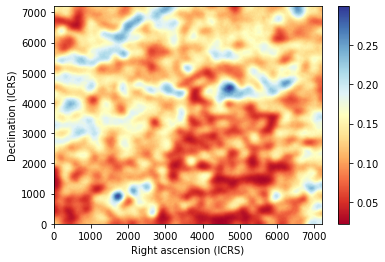

2022-08-13 13:43:15,655 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:43:15,657 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.52 [MHz] ...
2022-08-13 13:43:16,404 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:43:21,766 : simulate_frequency : INFO : Done simulate map at 191.52 [MHz].
2022-08-13 13:43:22,050 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_191.52.fits']


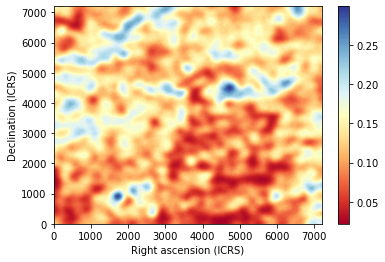

2022-08-13 13:43:23,952 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:43:23,954 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.68 [MHz] ...
2022-08-13 13:43:24,700 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:43:30,066 : simulate_frequency : INFO : Done simulate map at 191.68 [MHz].
2022-08-13 13:43:30,400 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_191.68.fits']


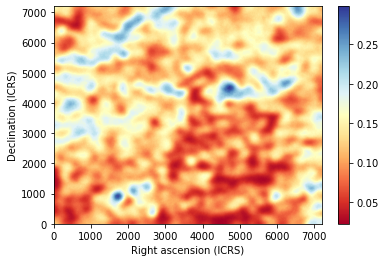

2022-08-13 13:43:32,301 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:43:32,303 : simulate_frequency : INFO : Simulating Galactic free-free map at 191.84 [MHz] ...
2022-08-13 13:43:33,051 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:43:38,417 : simulate_frequency : INFO : Done simulate map at 191.84 [MHz].
2022-08-13 13:43:38,700 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_191.84.fits']


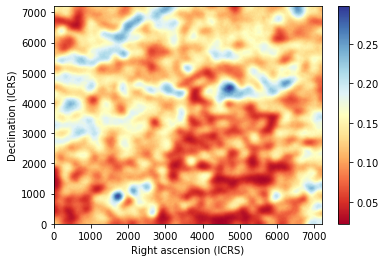

2022-08-13 13:43:40,600 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:43:40,602 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.00 [MHz] ...
2022-08-13 13:43:41,349 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:43:46,716 : simulate_frequency : INFO : Done simulate map at 192.00 [MHz].
2022-08-13 13:43:47,000 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_192.00.fits']


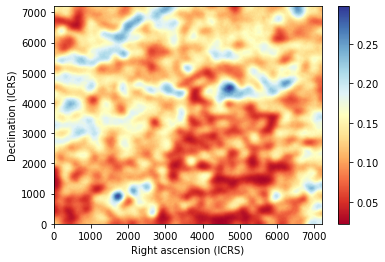

2022-08-13 13:43:48,902 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:43:48,904 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.16 [MHz] ...
2022-08-13 13:43:49,651 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:43:55,020 : simulate_frequency : INFO : Done simulate map at 192.16 [MHz].
2022-08-13 13:43:55,303 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_192.16.fits']


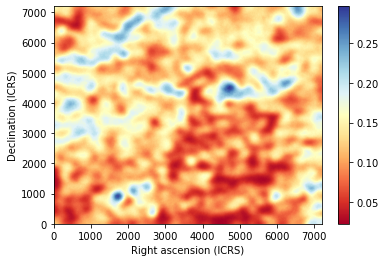

2022-08-13 13:43:57,201 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:43:57,202 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.32 [MHz] ...
2022-08-13 13:43:57,948 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:44:03,315 : simulate_frequency : INFO : Done simulate map at 192.32 [MHz].
2022-08-13 13:44:03,599 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_192.32.fits']


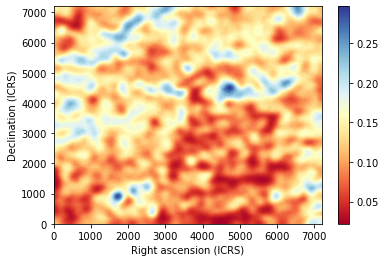

2022-08-13 13:44:05,496 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:44:05,498 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.48 [MHz] ...
2022-08-13 13:44:06,248 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:44:11,617 : simulate_frequency : INFO : Done simulate map at 192.48 [MHz].
2022-08-13 13:44:11,899 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_192.48.fits']


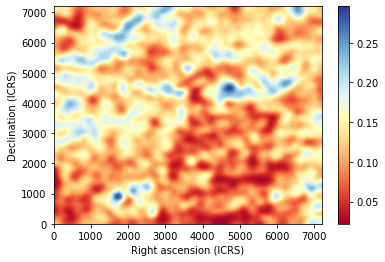

2022-08-13 13:44:13,800 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:44:13,802 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.64 [MHz] ...
2022-08-13 13:44:14,548 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:44:19,913 : simulate_frequency : INFO : Done simulate map at 192.64 [MHz].
2022-08-13 13:44:20,196 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_192.64.fits']


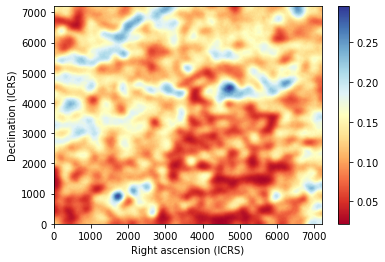

2022-08-13 13:44:22,635 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:44:22,637 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.80 [MHz] ...
2022-08-13 13:44:23,382 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:44:28,753 : simulate_frequency : INFO : Done simulate map at 192.80 [MHz].
2022-08-13 13:44:29,040 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_192.80.fits']


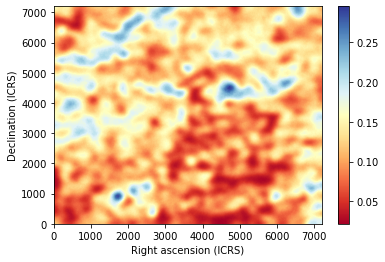

2022-08-13 13:44:30,941 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:44:30,943 : simulate_frequency : INFO : Simulating Galactic free-free map at 192.96 [MHz] ...
2022-08-13 13:44:31,689 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:44:37,056 : simulate_frequency : INFO : Done simulate map at 192.96 [MHz].
2022-08-13 13:44:37,338 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_192.96.fits']


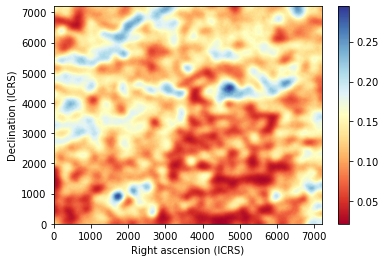

2022-08-13 13:44:39,241 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:44:39,243 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.12 [MHz] ...
2022-08-13 13:44:39,992 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:44:45,359 : simulate_frequency : INFO : Done simulate map at 193.12 [MHz].
2022-08-13 13:44:45,642 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_193.12.fits']


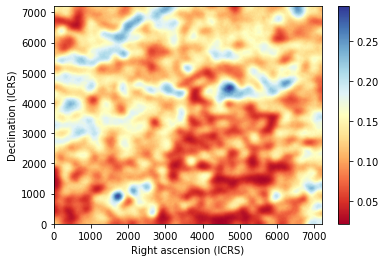

2022-08-13 13:44:47,545 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:44:47,547 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.28 [MHz] ...
2022-08-13 13:44:48,293 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:44:53,660 : simulate_frequency : INFO : Done simulate map at 193.28 [MHz].
2022-08-13 13:44:53,943 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_193.28.fits']


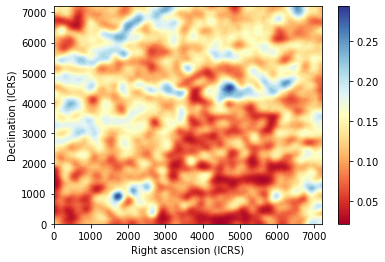

2022-08-13 13:44:55,843 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:44:55,845 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.44 [MHz] ...
2022-08-13 13:44:56,590 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:45:01,963 : simulate_frequency : INFO : Done simulate map at 193.44 [MHz].
2022-08-13 13:45:02,247 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_193.44.fits']


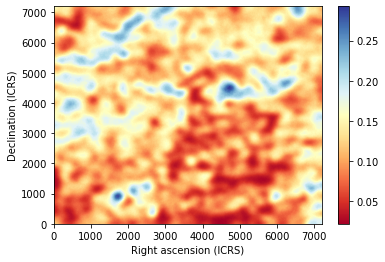

2022-08-13 13:45:04,151 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:45:04,152 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.60 [MHz] ...
2022-08-13 13:45:04,899 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:45:10,263 : simulate_frequency : INFO : Done simulate map at 193.60 [MHz].
2022-08-13 13:45:10,547 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_193.60.fits']


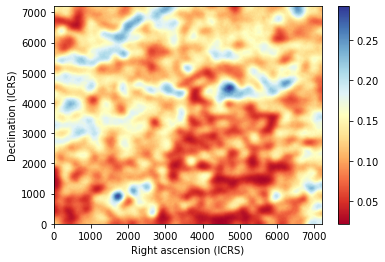

2022-08-13 13:45:12,447 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:45:12,449 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.76 [MHz] ...
2022-08-13 13:45:13,197 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:45:18,567 : simulate_frequency : INFO : Done simulate map at 193.76 [MHz].
2022-08-13 13:45:18,850 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_193.76.fits']


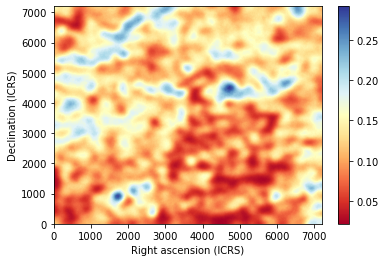

2022-08-13 13:45:20,752 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:45:20,754 : simulate_frequency : INFO : Simulating Galactic free-free map at 193.92 [MHz] ...
2022-08-13 13:45:21,499 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:45:26,868 : simulate_frequency : INFO : Done simulate map at 193.92 [MHz].
2022-08-13 13:45:27,153 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_193.92.fits']


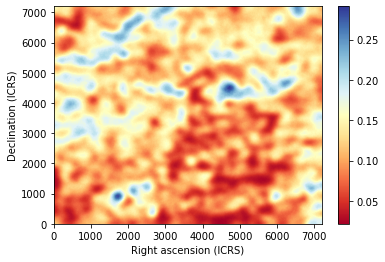

2022-08-13 13:45:29,051 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:45:29,053 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.08 [MHz] ...
2022-08-13 13:45:29,797 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:45:35,166 : simulate_frequency : INFO : Done simulate map at 194.08 [MHz].
2022-08-13 13:45:35,450 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_194.08.fits']


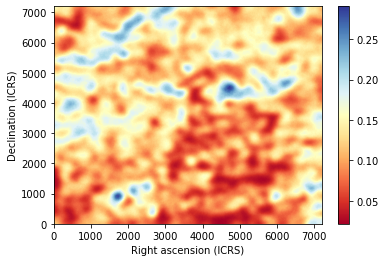

2022-08-13 13:45:37,351 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:45:37,353 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.24 [MHz] ...
2022-08-13 13:45:38,100 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:45:43,466 : simulate_frequency : INFO : Done simulate map at 194.24 [MHz].
2022-08-13 13:45:43,750 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_194.24.fits']


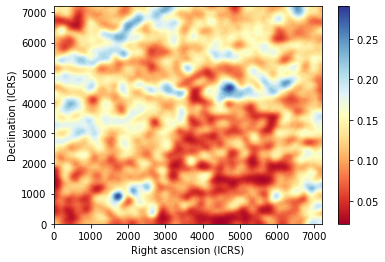

2022-08-13 13:45:45,646 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:45:45,648 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.40 [MHz] ...
2022-08-13 13:45:46,394 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:45:51,765 : simulate_frequency : INFO : Done simulate map at 194.40 [MHz].
2022-08-13 13:45:52,047 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_194.40.fits']


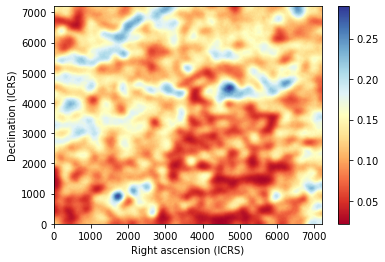

2022-08-13 13:45:54,487 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:45:54,489 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.56 [MHz] ...
2022-08-13 13:45:55,233 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:46:00,602 : simulate_frequency : INFO : Done simulate map at 194.56 [MHz].
2022-08-13 13:46:00,888 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_194.56.fits']


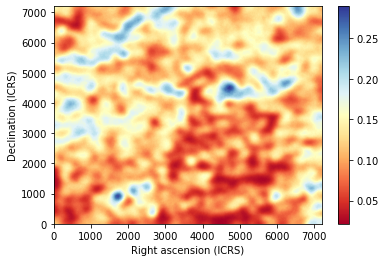

2022-08-13 13:46:02,786 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:46:02,788 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.72 [MHz] ...
2022-08-13 13:46:03,534 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:46:08,900 : simulate_frequency : INFO : Done simulate map at 194.72 [MHz].
2022-08-13 13:46:09,185 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_194.72.fits']


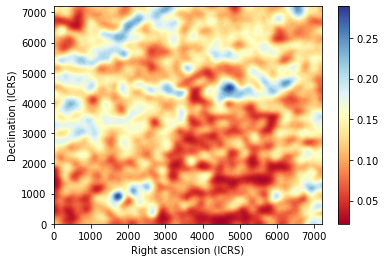

2022-08-13 13:46:11,085 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:46:11,087 : simulate_frequency : INFO : Simulating Galactic free-free map at 194.88 [MHz] ...
2022-08-13 13:46:11,835 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:46:17,201 : simulate_frequency : INFO : Done simulate map at 194.88 [MHz].
2022-08-13 13:46:17,485 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_194.88.fits']


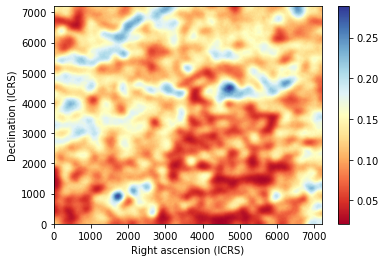

2022-08-13 13:46:19,393 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:46:19,395 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.04 [MHz] ...
2022-08-13 13:46:20,141 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:46:25,511 : simulate_frequency : INFO : Done simulate map at 195.04 [MHz].
2022-08-13 13:46:25,795 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_195.04.fits']


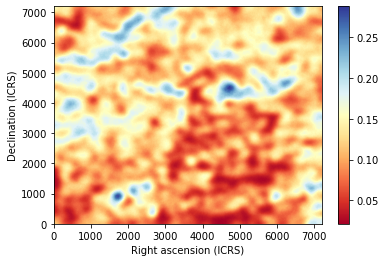

2022-08-13 13:46:27,697 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:46:27,699 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.20 [MHz] ...
2022-08-13 13:46:28,445 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:46:33,811 : simulate_frequency : INFO : Done simulate map at 195.20 [MHz].
2022-08-13 13:46:34,095 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_195.20.fits']


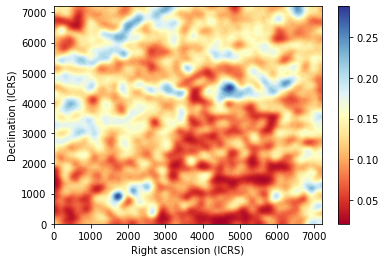

2022-08-13 13:46:35,998 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:46:36,000 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.36 [MHz] ...
2022-08-13 13:46:36,746 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:46:42,110 : simulate_frequency : INFO : Done simulate map at 195.36 [MHz].
2022-08-13 13:46:42,393 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_195.36.fits']


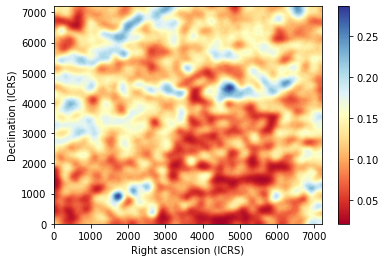

2022-08-13 13:46:44,294 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:46:44,295 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.52 [MHz] ...
2022-08-13 13:46:45,042 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:46:50,408 : simulate_frequency : INFO : Done simulate map at 195.52 [MHz].
2022-08-13 13:46:50,691 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_195.52.fits']


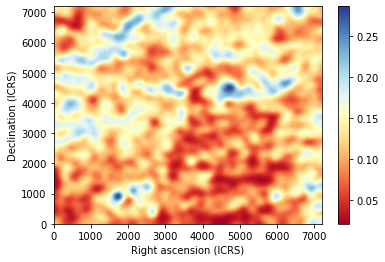

2022-08-13 13:46:52,591 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:46:52,593 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.68 [MHz] ...
2022-08-13 13:46:53,340 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:46:58,711 : simulate_frequency : INFO : Done simulate map at 195.68 [MHz].
2022-08-13 13:46:58,993 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_195.68.fits']


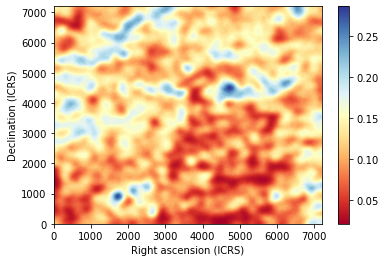

2022-08-13 13:47:00,892 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:47:00,894 : simulate_frequency : INFO : Simulating Galactic free-free map at 195.84 [MHz] ...
2022-08-13 13:47:01,642 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:47:07,007 : simulate_frequency : INFO : Done simulate map at 195.84 [MHz].
2022-08-13 13:47:07,292 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_195.84.fits']


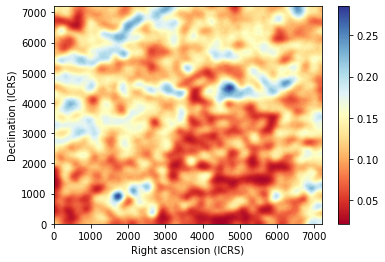

2022-08-13 13:47:09,191 : simulate : INFO : Simulating Galactic free-free ...
2022-08-13 13:47:09,193 : simulate_frequency : INFO : Simulating Galactic free-free map at 196.00 [MHz] ...
2022-08-13 13:47:09,938 : add_ss : INFO : The small scale map is generated using alpha=0.007854707431278349, beta=0.5260103708880837.
2022-08-13 13:47:15,305 : simulate_frequency : INFO : Done simulate map at 196.00 [MHz].
2022-08-13 13:47:15,589 : simulate : INFO : Done simulate Galactic free-free!


['/home/cxshan/data/fg21sim+/GalacticSimData/Gfree-band-hig-188-196-FoV4/gfree_fov4_0-27_196.00.fits']


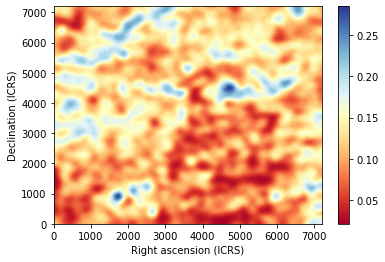

In [31]:
do_simulation(S.freqs['hig']['f'], S, s_outhig)